In [194]:
import os
import torch
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "3"

print(os.environ["CUDA_VISIBLE_DEVICES"])
print(torch.cuda.is_available())

3
True


In [195]:
import logging

logging.getLogger("spotipy").setLevel(logging.ERROR)

In [196]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import numpy as np
import matplotlib.pyplot as plt

client_credentials_manager = SpotifyClientCredentials(client_id='372d841a811545ffb7354cea56cdb9e8', client_secret='76220c93e48443ca927e1b469af1e968')
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)

In [197]:
def init(track_id):
    audio_features = sp.audio_features(track_id)[0]
    audio_analysis = sp.audio_analysis(track_id)

    return audio_features, audio_analysis

def get_sections_beats(audio_analysis):
    return audio_analysis['sections'], audio_analysis['segments'], audio_analysis['beats']

def analyze_overall(audio_features):
    overall_meter = audio_features['time_signature']
    overall_tempo = audio_features['tempo']
    mode = 'Major' if audio_features['mode'] == 1 else 'Minor'
    keys = ["C", "C#", "D", "D#", "E", "F", "F#", "G", "G#", "A", "A#", "B"]
    key = keys[audio_features['key']]

    danceability = audio_features['danceability']
    energy = audio_features['energy']
    valence = audio_features['valence']
    acousticness = audio_features['acousticness']
    instrumentalness = audio_features['instrumentalness']
    liveness = audio_features['liveness']
    speechiness = audio_features['speechiness']
    loudness = audio_features['loudness']
    
    print(f"Overall Meter: {overall_meter}/4")
    print(f"Overall Tempo: {overall_tempo} BPM")
    print(f"OVerall Mode: {mode}")
    print(f"Overall Key: {key}")
    print()
    
    print(f"Danceability: {danceability:.2f}")
    print(f"Energy: {energy:.2f}")
    print(f"Valence (Mood): {valence:.2f}")
    print(f"Acousticness: {acousticness:.2f}")
    print(f"Instrumentalness: {instrumentalness:.2f}")
    print(f"Liveness: {liveness:.2f}")
    print(f"Speechiness: {speechiness:.2f}")
    print(f"Loudness: {loudness:.2f} dB")

    return overall_meter, overall_tempo, mode, key

def analyze_overall_beats(beats):
    beat_start_times = list(map(lambda beat: beat['start'], beats))
    beat_durations = list(map(lambda beat: beat['duration'], beats))

    return beat_start_times, beat_durations

In [198]:
def get_section_tempos(sections):
    tempo_start_times = list(map(lambda section: section['start'], sections))
    tempo_values = list(map(lambda section: section['tempo'], sections))
    meter_start_times = tempo_start_times
    meter_values = list(map(lambda section: section['time_signature'], sections))

    return tempo_start_times, tempo_values, meter_start_times, meter_values

def get_section_beats(sections, beats):
    section_start_times = []
    section_beats = []
    section_beat_densities = []
    
    for section in sections:
        section_start = section['start']
        section_duration = section['duration']
        section_beat = [beat for beat in beats if section_start <= beat['start'] < section_start + section_duration]
        
        section_beats.append(section_beat)
        
        if section_beat:
            average_beat_duration = np.mean([beat['duration'] for beat in section_beat])
            beat_density = 1 / average_beat_duration
            
            section_beat_densities.append(beat_density)
        else:
            section_beat_densities.append(0)
        
        section_start_times.append(section_start)

    if section_beat_densities:
        average_beat_density = np.mean(section_beat_densities)
    else:
        average_beat_density = 0

    return section_start_times, section_beats, section_beat_densities, average_beat_density

In [285]:
def draw_section_beat_density_threshold(section_start_times, section_beat_densities, average_beat_density, high_threshold, low_threshold):
    plt.figure(figsize=(10, 5))
    
    plt.plot(section_start_times, section_beat_densities, marker='o', linestyle='-', color='b')
    plt.axhline(y=average_beat_density, color='r', linestyle='--', label='Average Beat Density')  # Plot average line for reference
    plt.axhline(y=high_threshold, color='g', linestyle='--', label=f'High Threshold ({density_weight*100:.0f}% above average)')  # Plot high threshold line
    plt.axhline(y=low_threshold, color='orange', linestyle='--', label=f'Low Threshold ({density_weight*100:.0f}% below average)')  # Plot low threshold line
    
    plt.xlabel('Time (s)')
    plt.ylabel('Beat Density (beats per second)')
    plt.title('Beat Density per Section')
    plt.legend()

    plt.savefig('beat_density.png')
    
    plt.show()

def analyze_section_beat_density_threshold(section_start_times, section_beat_densities, density_weight):
    high_threshold = average_beat_density * (1 + density_weight)
    low_threshold = average_beat_density * (1 - density_weight)
    
    section_beat_density_threshold = []
    
    # -1: low, 0: avg, 1: high
    for idx, section_start in enumerate(section_start_times):
        beat_density = section_beat_densities[idx]
        print(f"Section at {section_start:.2f}s\t|\tBeat Density: {beat_density:.2f} beats per second", end = "\t|\t")
        
        if beat_density > high_threshold:
            section_beat_density_threshold.append(1)
            print("High")
        elif beat_density < low_threshold:
            section_beat_density_threshold.append(-1)
            print("Low")
        else:
            section_beat_density_threshold.append(0)
            print("-")

    draw_section_beat_density_threshold(section_start_times, section_beat_densities, average_beat_density, high_threshold, low_threshold)

    return section_beat_density_threshold

In [200]:
def get_section_loudness_timbre(sections, audio_analysis):
    section_loudnesses = [section['loudness'] for section in sections]
    section_timbres = []
    
    for section in sections:
        section_start = section['start']
        section_end = section_start + section['duration']
    
        section_segments = [
            segment for segment in segments 
            if section_start <= segment['start'] < section_end
        ]
    
        if section_segments:
            timbre_values = [segment['timbre'] for segment in section_segments]
            avg_timbre = np.mean(timbre_values, axis=0).tolist()
        else:
            avg_timbre = [0.0] * 12
    
        section_timbres.append(avg_timbre)

    return section_loudnesses, section_timbres

In [283]:
import pandas as pd

def analyze_mood(audio_features, section_tempo, valence_weight, energy_weight, danceability_weight, valence, energy, danceability):
    if section_tempo <= 60:
        tempo_mood_weight = 0.3
    elif section_tempo <= 76:
        tempo_mood_weight = 0.6
    elif section_tempo <= 108:
        tempo_mood_weight = 0.9
    elif section_tempo <= 120:
        tempo_mood_weight = 1
    elif section_tempo <= 156:
        tempo_mood_weight = 1.3
    elif section_tempo <= 200:
        tempo_mood_weight = 1.5
    else:
        tempo_mood_weight = 1.8
    
    return (valence * valence_weight + energy * energy_weight + danceability * danceability_weight) * tempo_mood_weight

def analyze_mood_over_sections(audio_features, sections, tempo_values):
    valence = audio_features['valence']
    energy = audio_features['energy']
    danceability = audio_features['danceability']
    
    section_moods = []
    
    for i, section in enumerate(sections):
        start = section['start']
        duration = section['duration']
        
        mood_score = analyze_mood(audio_features, tempo_values[i], valence_weight, energy_weight, danceability_weight, valence, energy, danceability)
        
        if mood_score >= 0.7:
            mood = 'Happy'
        elif mood_score >= 0.5:
            mood = 'Content'
        elif mood_score >= 0.3:
            mood = 'Melancholic'
        else:
            mood = 'Sad'
        
        section_moods.append({'start': start, 'duration': duration, 'mood': mood})

    section_moods = pd.DataFrame(section_moods)
    draw_mood_changes(section_moods)
    
    return section_moods

def draw_mood_changes(section_moods):
    time_points = []
    mood_values = []
    mood_mapping = {'Sad': 0, 'Melancholic': 1, 'Content': 2, 'Happy': 3}
    
    for _, row in section_moods.iterrows():
        time_points.append(row['start'])
        mood_values.append(mood_mapping[row['mood']])

    plt.figure(figsize=(10, 5))
    
    plt.plot(time_points, mood_values, marker='o', linestyle='-')
    plt.xlabel('Time (seconds)')
    plt.ylabel('Mood')
    plt.yticks(list(mood_mapping.values()), list(mood_mapping.keys()))
    plt.title('Mood Changes Over Time')

    plt.savefig('mood_changes_over_time.png')
    
    plt.show()

In [273]:
track_id = '2t8UoPFVXCRZulscbwv0QL' # We Will Rock You
track_id = '6RUKPb4LETWmmr3iAEQktW' # Something Just Like This
track_id = '0bYg9bo50gSsH3LtXe2SQn' # All I Want for Christmas Is You
density_weight = 0.07
valence_weight, energy_weight, danceability_weight = 0.5, 0.5, 0.2

In [274]:
audio_features, audio_analysis = init(track_id)
sections, segments, beats = get_sections_beats(audio_analysis)

In [275]:
overall_meter, overall_tempo, mode, key = analyze_overall(audio_features)
beat_start_times, beat_durations = analyze_overall_beats(beats)

Overall Meter: 4/4
Overall Tempo: 150.273 BPM
OVerall Mode: Major
Overall Key: G

Danceability: 0.34
Energy: 0.63
Valence (Mood): 0.35
Acousticness: 0.16
Instrumentalness: 0.00
Liveness: 0.07
Speechiness: 0.04
Loudness: -7.46 dB


In [276]:
tempo_start_times, tempo_values, meter_start_times, meter_values = get_section_tempos(sections)
section_start_times, section_beats, section_beat_densities, average_beat_density = get_section_beats(sections, beats)

Section at 0.00s	|	Beat Density: 1.82 beats per second	|	Low
Section at 7.33s	|	Beat Density: 1.83 beats per second	|	Low
Section at 53.84s	|	Beat Density: 2.28 beats per second	|	-
Section at 86.34s	|	Beat Density: 2.50 beats per second	|	-
Section at 108.31s	|	Beat Density: 2.50 beats per second	|	-
Section at 130.29s	|	Beat Density: 2.50 beats per second	|	-
Section at 159.86s	|	Beat Density: 2.50 beats per second	|	-
Section at 172.66s	|	Beat Density: 2.49 beats per second	|	-
Section at 191.95s	|	Beat Density: 2.50 beats per second	|	-
Section at 231.93s	|	Beat Density: 2.51 beats per second	|	High


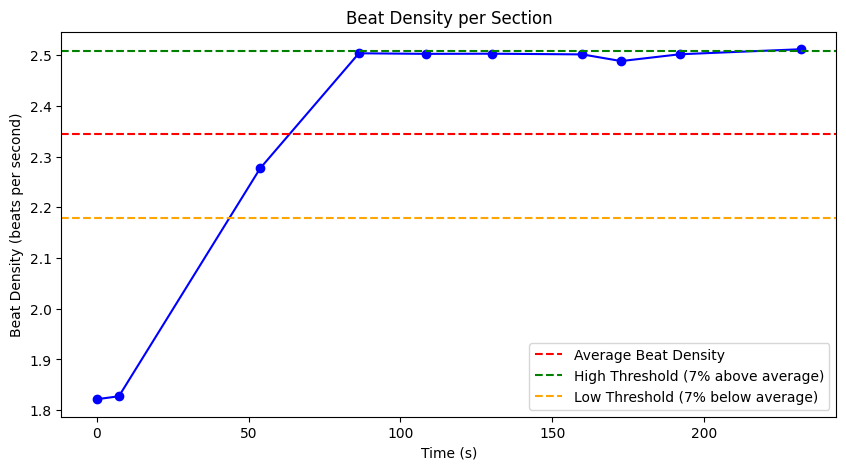

In [286]:
section_beat_density_threshold = analyze_section_beat_density_threshold(section_start_times, section_beat_densities, density_weight)

In [278]:
section_loudnesses, section_timbres = get_section_loudness_timbre(sections, audio_analysis)

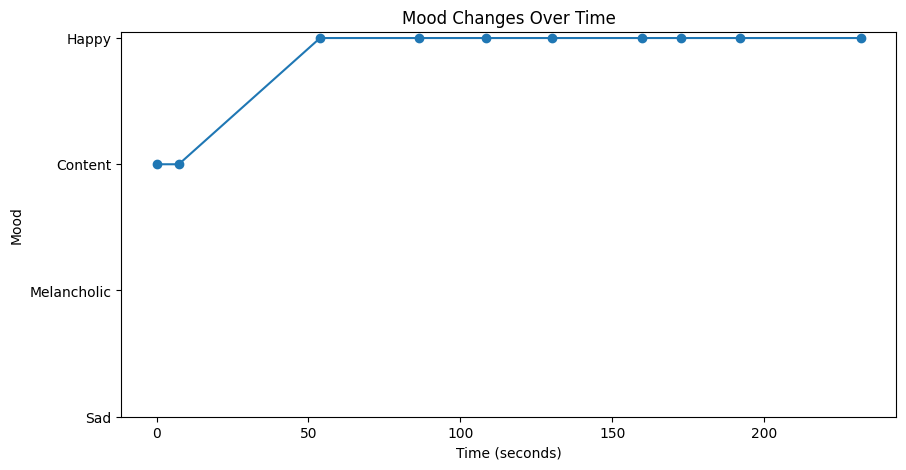

In [287]:
df = analyze_mood_over_sections(audio_features, sections, tempo_values)

- 음을 음의 높이에 맞춰 튀기자
- 공의 크기 -> 음의 세기 (intensity)
- 도형의 개수를 최소화 + 박자 = 선분 유지
- 장애물이 등장하는 스타일 = 곡의 전체적인 분위기

In [280]:
import librosa
from librosa import note_to_midi
from IPython.display import Audio

audio_file = 'musics/We Will Rock You (Movie Mix)-11-Que....mp3'
audio_file = 'musics/Something Just Like This-5-The Chai....mp3'
audio_file = 'musics/All I Want for Christmas Is You-2-M....mp3'

y, sr = librosa.load(audio_file)

section_pitch_values = []

def analyze_timbre(timbre_vector):
    characteristics = []
    
    if timbre_vector[2] < 0:
        characteristics.append('flat')
    elif timbre_vector[3] > 0.5:
        characteristics.append('strong attack')
    if timbre_vector[1] > 0:
        characteristics.append('bright')
    if timbre_vector[4] > 0:
        characteristics.append('resonant')
    
    if len(characteristics) == 0:
        return 'neutral'
    else:
        return ', '.join(characteristics)

for i in range(len(section_start_times) - 1):
    start = section_start_times[i]
    end = section_start_times[i + 1]
    beat_interval = 1 / section_beat_densities[i]
    
    start_sample = int(start * sr)
    end_sample = int(end * sr)
    y_section = y[start_sample:end_sample]
    
    pitches, magnitudes = librosa.piptrack(y=y_section, sr=sr)
    section_pitches = []
    
    current_time = 0
    
    while current_time < (end - start):
        beat_frame = librosa.time_to_frames(current_time, sr=sr)
        
        if beat_frame < pitches.shape[1]:
            index = magnitudes[:, beat_frame].argmax()
            pitch = pitches[index, beat_frame]
            volume = magnitudes[index, beat_frame]
            
            if pitch > 0:
                note = librosa.hz_to_note(pitch)
                section_pitches.append((current_time + start, note, volume))
                
        current_time += beat_interval

    volumes = [volume for _, _, volume in section_pitches]
    
    if len(volumes) > 0:
        mean_volume = np.mean(volumes)
        std_volume = np.std(volumes)
        z_scores = (volumes - mean_volume) / std_volume
        threshold = -3 # for vibration
        threshold = 0.6 # for shapes
    else:
        threshold = 0.6
        z_scores = []

    filtered_pitches = [
        (time, note, volume) for (time, note, volume), z in zip(section_pitches, z_scores) if z >= threshold
    ]
    section_pitch_values.append((start, end, filtered_pitches))

timbre_data_per_pitch = []

for start, end, pitches in section_pitch_values:
    for time, note, volume in pitches:
        matching_segment = next((segment for segment in segments if segment['start'] <= time < (segment['start'] + segment['duration'])), None)

        if matching_segment:
            timbre_data_per_pitch.append((time, note, volume, matching_segment['timbre']))

pitch_characteristics = []

for time, note, volume, timbre_vector in timbre_data_per_pitch:
    timbre_characteristic = analyze_timbre(timbre_vector)
    pitch_characteristics.append((time, note, volume, timbre_characteristic))
    
    print(f"Pitch at {time:.2f}s ({note}): Timbre characteristic is {timbre_characteristic}")

# all_notes = sorted(set(note for _, note, _, _ in pitch_characteristics), key=lambda x: note_to_midi(x))
# note_to_index = {note: idx for idx, note in enumerate(all_notes)}

Pitch at 6.59s (G3): Timbre characteristic is flat, bright, resonant
Pitch at 7.14s (B3): Timbre characteristic is bright, resonant
Pitch at 10.07s (G6): Timbre characteristic is strong attack, bright, resonant
Pitch at 10.61s (F♯5): Timbre characteristic is strong attack, bright, resonant
Pitch at 13.35s (A5): Timbre characteristic is resonant
Pitch at 18.27s (G5): Timbre characteristic is bright, resonant
Pitch at 18.82s (A♯5): Timbre characteristic is strong attack, bright, resonant
Pitch at 21.56s (A6): Timbre characteristic is strong attack, bright, resonant
Pitch at 24.84s (C♯6): Timbre characteristic is strong attack, bright, resonant
Pitch at 31.41s (D♯3): Timbre characteristic is bright, resonant
Pitch at 34.69s (C6): Timbre characteristic is bright, resonant
Pitch at 35.24s (E3): Timbre characteristic is resonant
Pitch at 35.78s (D5): Timbre characteristic is strong attack, resonant
Pitch at 36.33s (C5): Timbre characteristic is strong attack, resonant
Pitch at 37.42s (B4): T

In [281]:
merged_pitch_characteristics = []
i = 0

while i < len(pitch_characteristics):
    current_time, current_note, current_volume, current_characteristic = pitch_characteristics[i]
    # Merge "strong attack" pitches
    if 'strong attack' in current_characteristic:
        j = i + 1
        while j < len(pitch_characteristics):
            next_time, next_note, next_volume, next_characteristic = pitch_characteristics[j]
            if next_note == current_note and 'strong attack' not in next_characteristic:
                j += 1
            else:
                break
        if j > i + 1:
            current_characteristic = current_characteristic.replace('strong attack', 'flat')
        merged_pitch_characteristics.append((current_time, current_note, current_volume, current_characteristic))
        i = j
    else:
        merged_pitch_characteristics.append((current_time, current_note, current_volume, current_characteristic))
        i += 1

# Merge volumes based on the previous rules
i = 0
final_pitch_characteristics = []

while i < len(merged_pitch_characteristics):
    current_time, current_note, current_volume, current_characteristic = merged_pitch_characteristics[i]
    merged_volume = current_volume
    j = i + 1
    while j < len(merged_pitch_characteristics):
        next_time, next_note, next_volume, next_characteristic = merged_pitch_characteristics[j]
        if 'flat' in current_characteristic and current_note == next_note:
            merged_volume += next_volume
            j += 1
        elif 'flat' in next_characteristic and current_note == next_note:
            merged_volume += next_volume
            j += 1
        elif 'strong attack' not in current_characteristic and current_note == next_note and 'strong attack' not in next_characteristic:
            merged_volume += next_volume
            j += 1
        else:
            break
    final_pitch_characteristics.append((current_time, current_note, merged_volume, current_characteristic))
    i = j

# Get all unique notes across all sections to arrange y-axis
all_notes = sorted(set(note for _, note, _, _ in final_pitch_characteristics), key=lambda x: note_to_midi(x))

# Convert note labels to MIDI numbers for plotting
note_to_index = {note: idx for idx, note in enumerate(all_notes)}

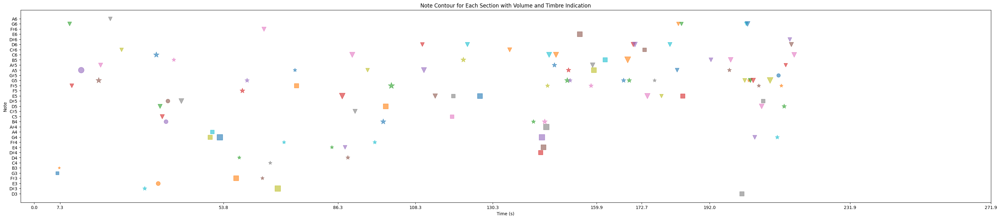

In [289]:
# Plot the pitch values for each section with correct time representation
plt.figure(figsize=(40, 8))
marker_dict = {
    'flat': 's',  # rectangle
    'strong attack': 'v',  # inverted triangle
    'bright': '*',  # glow
    'resonant': 'o',  # double circle
    'neutral': 'o'  # circle
}
for time, note, volume, characteristic in final_pitch_characteristics:
    marker = 'o'  # default marker for 'neutral'
    characteristics = characteristic.split(', ')
    for char in characteristics:
        if char in marker_dict:
            marker = marker_dict[char]
            break
    
    plt.scatter(time, note_to_index[note], s=volume, marker=marker, alpha=0.6)  # Use volume to scale the marker size

# Set x-axis ticks to include section start and end times
x_ticks = section_start_times + [section_start_times[-1] + (section_start_times[-1] - section_start_times[-2])]
plt.xticks(x_ticks)

# Set y-axis to show unique notes in sorted order by pitch
plt.yticks(ticks=range(len(all_notes)), labels=all_notes)

plt.xlabel('Time (s)')
plt.ylabel('Note')
plt.title('Note Contour for Each Section with Volume and Timbre Indication')

plt.savefig('note_volume_timbre.png')
plt.show()

In [263]:
click_times = [time for time, _, _, _ in final_pitch_characteristics]
click_dynamic = librosa.clicks(times=click_times, sr=sr, click_freq=660, click_duration=0.25, length=len(y))

Audio(data=y + click_dynamic, rate=sr)

In [37]:
!python lyrics_timestamp.py

Traceback (most recent call last):
  File "/home/j-k11d203/lyrics_timestamp.py", line 3, in <module>
    from transformers import AutoModelForSpeechSeq2Seq, AutoProcessor, pipeline
ModuleNotFoundError: No module named 'transformers'


In [264]:
f = open('./lyrics_timestamp.txt', 'r')

lyrics_timestamps = [x.strip() for x in f.readlines()]

f.close()

In [265]:
lyrics_timestamps

['{\'text\': " I\'ve", \'timestamp\': (7.7, 7.7)}',
 "{'text': ' been', 'timestamp': (7.7, 8.14)}",
 "{'text': ' reading', 'timestamp': (8.14, 8.56)}",
 "{'text': ' books', 'timestamp': (8.56, 9.0)}",
 "{'text': ' of', 'timestamp': (9.0, 9.32)}",
 "{'text': ' old,', 'timestamp': (9.32, 10.1)}",
 "{'text': ' the', 'timestamp': (10.1, 10.42)}",
 "{'text': ' legends', 'timestamp': (10.42, 11.02)}",
 "{'text': ' and', 'timestamp': (11.02, 11.4)}",
 "{'text': ' the', 'timestamp': (11.4, 11.62)}",
 "{'text': ' myths', 'timestamp': (11.62, 12.1)}",
 "{'text': ' Achilles', 'timestamp': (12.68, 13.34)}",
 "{'text': ' and', 'timestamp': (13.34, 13.68)}",
 "{'text': ' his', 'timestamp': (13.68, 13.96)}",
 "{'text': ' gold,', 'timestamp': (13.96, 14.8)}",
 "{'text': ' Achilles', 'timestamp': (14.8, 15.62)}",
 "{'text': ' and', 'timestamp': (15.62, 16.04)}",
 "{'text': ' his', 'timestamp': (16.04, 16.34)}",
 "{'text': ' gifts', 'timestamp': (16.34, 16.86)}",
 "{'text': ' And', 'timestamp': (17.2, 1

In [266]:
import ast

parsed_lyrics_timestamps = []
parsed_timestamps = []

for timestamp in lyrics_timestamps:
    parsed_lyrics_timestamps.append(ast.literal_eval(timestamp))
    parsed_timestamps.append((parsed_lyrics_timestamps[-1]["timestamp"][0], parsed_lyrics_timestamps[-1]["timestamp"][1] - parsed_lyrics_timestamps[-1]["timestamp"][0]))

In [267]:
parsed_timestamps

[(7.7, 0.0),
 (7.7, 0.4400000000000004),
 (8.14, 0.41999999999999993),
 (8.56, 0.4399999999999995),
 (9.0, 0.3200000000000003),
 (9.32, 0.7799999999999994),
 (10.1, 0.3200000000000003),
 (10.42, 0.5999999999999996),
 (11.02, 0.3800000000000008),
 (11.4, 0.21999999999999886),
 (11.62, 0.4800000000000004),
 (12.68, 0.6600000000000001),
 (13.34, 0.33999999999999986),
 (13.68, 0.28000000000000114),
 (13.96, 0.8399999999999999),
 (14.8, 0.8199999999999985),
 (15.62, 0.41999999999999993),
 (16.04, 0.3000000000000007),
 (16.34, 0.5199999999999996),
 (17.2, 0.1999999999999993),
 (17.4, 0.33999999999999986),
 (17.74, 0.740000000000002),
 (18.48, 0.9199999999999982),
 (19.4, 0.360000000000003),
 (19.76, 0.5199999999999996),
 (20.28, 0.4399999999999977),
 (20.72, 0.28000000000000114),
 (21.0, 0.4800000000000004),
 (22.16, 0.46000000000000085),
 (22.62, 0.5),
 (23.12, 0.4399999999999977),
 (23.56, 0.38000000000000256),
 (23.94, 0.1999999999999993),
 (24.14, 0.35999999999999943),
 (24.5, 0.64000000

# 서장원

In [217]:
def analyze_mood_over_sections_2(audio_features, sections, tempo_values):
    valence = audio_features['valence']
    energy = audio_features['energy']
    danceability = audio_features['danceability']
    
    section_moods = []
    
    for i, section in enumerate(sections):
        start = section['start']
        duration = section['duration']
        
        mood_score = analyze_mood(audio_features, tempo_values[i], valence_weight, energy_weight, danceability_weight, valence, energy, danceability)
        
        if mood_score >= 0.7:
            mood = 'Happy'
        elif mood_score >= 0.5:
            mood = 'Content'
        elif mood_score >= 0.3:
            mood = 'Melancholic'
        else:
            mood = 'Sad'
        
        section_moods.append({'start': start, 'duration': duration, 'mood': mood})
    
    return section_moods

In [198]:
import json
from collections import OrderedDict

j = OrderedDict()
j["code"] = 200
j["data"] = {"metadata": {"bpm": overall_tempo, "key": key, "genre": "pop", "mood": "energetic"}, "timeframes": [], "sections": [], "effects": []}

In [25]:
import librosa
import numpy as np
import scipy.signal
from collections import OrderedDict

# Assuming 'y', 'sr', and 'parsed_timestamps' are already defined

def analyze_band(y, sr, band):
    # Ensure that the band values are within a valid range
    nyquist = sr / 2
    band = (max(0, band[0]), min(nyquist, band[1]))
    
    # Design bandpass filter
    sos = scipy.signal.butter(10, band, btype='bandpass', fs=sr, output='sos')
    y_filtered = scipy.signal.sosfilt(sos, y)

    # Calculate energy
    energy = float(np.sum(y_filtered ** 2))  # Convert to Python float

    # Calculate dominant frequency
    n_fft = min(2048, len(y_filtered))  # Adjust n_fft to be the smaller of 2048 or the length of the filtered signal
    if len(y_filtered) < n_fft:
        n_fft = len(y_filtered)
    D = np.abs(librosa.stft(y_filtered, n_fft=n_fft))
    freqs = librosa.fft_frequencies(sr=sr)
    dominant_frequency = float(freqs[np.argmax(np.sum(D, axis=1))])  # Convert to Python float

    return energy, dominant_frequency

def analyze_beats(y_seg, sr):
    # Detect onsets in the segment
    onset_frames = librosa.onset.onset_detect(y=y_seg, sr=sr)
    onset_times = librosa.frames_to_time(onset_frames, sr=sr)

    # Detect beats in the segment
    tempo, beat_frames = librosa.beat.beat_track(y=y_seg, sr=sr)
    beat_times = librosa.frames_to_time(beat_frames, sr=sr)

    # Calculate beat intensities using RMS energy around each beat
    rms = librosa.feature.rms(y=y_seg)[0]
    beat_analysis = []

    for beat_frame in beat_frames:
        beat_time = float(librosa.frames_to_time([beat_frame], sr=sr)[0])  # Convert to Python float
        beat_rms = float(rms[beat_frame]) if beat_frame < len(rms) else 0.0  # Convert to Python float

        # Check if the beat is also an onset (within a tolerance of 50ms)
        is_onset = any(np.isclose(beat_time, onset_times, atol=0.05))

        beat_analysis.append({
            "time": beat_time,
            "intensity": beat_rms,
            "is_onset": is_onset
        })

    return beat_analysis

for time in parsed_timestamps:
    d = OrderedDict()
    
    d["time"] = time[0]
    d["duration"] = time[1]

    tmp_start = time[0]
    tmp_end = time[0] + time[1]

    start_sample = int(tmp_start * sr)
    end_sample = int(tmp_end * sr)
    y_seg = y[start_sample:end_sample]

    if len(y_seg) == 0:
        continue

    nyquist = sr / 2
    low_band = (20, 250)
    mid_band = (250, 2000)
    high_band = (2000, nyquist - 1)

    # Analyze frequency bands
    low_energy, low_dominant_freq = analyze_band(y_seg, sr, low_band)
    mid_energy, mid_dominant_freq = analyze_band(y_seg, sr, mid_band)
    high_energy, high_dominant_freq = analyze_band(y_seg, sr, high_band)

    d["spectrum"] = OrderedDict()
    
    d["spectrum"]["low"] = OrderedDict()
    d["spectrum"]["low"]["energy"] = low_energy
    d["spectrum"]["low"]["dominantFreq"] = low_dominant_freq
    
    d["spectrum"]["mid"] = OrderedDict()
    d["spectrum"]["mid"]["energy"] = mid_energy
    d["spectrum"]["mid"]["dominantFreq"] = mid_dominant_freq
    
    d["spectrum"]["high"] = OrderedDict()
    d["spectrum"]["high"]["energy"] = high_energy
    d["spectrum"]["high"]["dominantFreq"] = high_dominant_freq

    beats_info = analyze_beats(y_seg, sr)
    d["beat"] = OrderedDict()

    if beats_info:
        d["beat"]["intensity"] = beats_info[0]["intensity"]
        d["beat"]["isOnset"] = beats_info[0]["is_onset"]
    else:
        continue

    j["data"]["timeframes"].append(d)

NameError: name 'parsed_timestamps' is not defined

In [200]:
section_moods = analyze_mood_over_sections_2(audio_features, sections, tempo_values)

for i, section in enumerate(sections):
    d = OrderedDict()
    d["start"] = section["start"]
    d["end"] = section["start"] + section["duration"]
    d["type"] = "verse"
    d["energy"] = section_moods[i]
    j["data"]["sections"].append(d)

In [201]:
print(json.dumps(j, ensure_ascii=False, indent="\t"))

{
	"code": 200,
	"data": {
		"metadata": {
			"bpm": 81.417,
			"key": "B",
			"genre": "pop",
			"mood": "energetic"
		},
		"timeframes": [
			{
				"time": 11.54,
				"duration": 0.8200000000000003,
				"spectrum": {
					"low": {
						"energy": 160.4983392183475,
						"dominantFreq": 86.1328125
					},
					"mid": {
						"energy": 113.24960677944958,
						"dominantFreq": 829.0283203125
					},
					"high": {
						"energy": 15.591254150783584,
						"dominantFreq": 2562.451171875
					}
				},
				"beat": {
					"intensity": 0.15649589896202087,
					"isOnset": true
				}
			},
			{
				"time": 12.36,
				"duration": 0.3200000000000003,
				"spectrum": {
					"low": {
						"energy": 188.56535199119097,
						"dominantFreq": 75.3662109375
					},
					"mid": {
						"energy": 92.2974927333741,
						"dominantFreq": 322.998046875
					},
					"high": {
						"energy": 53.66286384720149,
						"dominantFreq": 2260.986328125
					}
				},
				"beat": {
					"intensity": 0.233085185

# 김재혁

1. 색상 세부 조정 (energy, valence, loudness, beat_density)
2. 색상 -> 키워드화
3. 일정 범위 내 색상 휠 랜덤 값 반환
4. 이미지 백그라운드에 함께 반환

In [268]:
import json
from collections import OrderedDict

j = OrderedDict()
j["code"] = 200
j["data"] = {"backgrounds": [], "vibrations": [], "notes": []}

for time, duration in parsed_timestamps:
    j["data"]["vibrations"].append({"time": time, "duration": duration})

In [269]:
section_loudnesses

[-21.825,
 -15.326,
 -9.333,
 -9.242,
 -5.777,
 -5.722,
 -17.828,
 -5.16,
 -9.198,
 -4.226,
 -39.722]

In [270]:
section_moods = analyze_mood_over_sections_2(audio_features, sections, tempo_values)

for i, section in enumerate(sections):
    d = OrderedDict()
    d["start"] = section["start"]
    d["end"] = section["start"] + section["duration"]

    mood = section_moods[i]["mood"]
    loud = section_loudnesses[i]

    if loud < -20:
        loud = "Silent"
    elif loud <= -12:
        loud = "Quiet"
    elif loud <= -7:
        loud = "Moderate"
    else:
        loud = "Loud"

    # if mood == 'Happy':
    #     mood = "hsla(53, 100%, 50%, 1)"
    # elif mood == 'Content':
    #     mood = "hsla(102, 100%, 35%, 1)"
    # elif mood == 'Sad':
    #     mood = "hsla(238, 100%, 16%, 1)"
    # else:
    #     mood = "hsla(267, 100%, 29%, 1)"
    
    d["color"] = mood + "," + loud
    j["data"]["backgrounds"].append(d)

print(json.dumps(j, ensure_ascii=False, indent="\t"))

{
	"code": 200,
	"data": {
		"backgrounds": [
			{
				"start": 0.0,
				"end": 9.59921,
				"color": "Content,Silent"
			},
			{
				"start": 9.59921,
				"end": 28.2344,
				"color": "Content,Quiet"
			},
			{
				"start": 28.2344,
				"end": 47.44883,
				"color": "Content,Moderate"
			},
			{
				"start": 47.44883,
				"end": 64.34667,
				"color": "Content,Moderate"
			},
			{
				"start": 64.34668,
				"end": 91.10276,
				"color": "Content,Loud"
			},
			{
				"start": 91.10275,
				"end": 141.83363,
				"color": "Content,Loud"
			},
			{
				"start": 141.83363,
				"end": 158.13731,
				"color": "Content,Quiet"
			},
			{
				"start": 158.13731,
				"end": 179.68291000000002,
				"color": "Content,Loud"
			},
			{
				"start": 179.6829,
				"end": 194.23809,
				"color": "Content,Moderate"
			},
			{
				"start": 194.23808,
				"end": 235.68866,
				"color": "Content,Loud"
			},
			{
				"start": 235.68867,
				"end": 247.16,
				"color": "Content,Silent"
			}
		],
		"vibration

In [271]:
import random

width = 80
height = 80

note_order = {'C': 0, 'C♯': 1, 'D': 2, 'D♯': 3, 'E': 4, 'F': 5, 'F♯': 6, 'G': 7, 'G♯': 8, 'A': 9, 'A♯': 10, 'B': 11}
timestamp_gap = 0.5
minimum_flat_duration = 1.0

def note_value(note):
    return int(note[-1]) * 12 + note_order[note[:-1]]

def note_to_frequency(note):
    index = len(note)
    
    while index > 0 and note[index - 1].isdigit():
        index -= 1
        
    noteName = note[:index]
    octave = note[index:]

    if not octave.isdigit():
        raise ValueError('Invalid octave in note')
    octave = int(octave)
    
    semitoneOffset = note_order.get(noteName)
    
    if semitoneOffset is None:
        raise ValueError(f'Invalid note name: {noteName}')
    
    # Calculate the number of semitones from A4
    n = (octave - 4) * 12 + semitoneOffset - 9
    
    # Calculate the frequency
    color_frequency = 440 * (2 ** (n / 12))
    
    return color_frequency

def frequencyToHue(color_frequency):
    fMin = 27.5  # A0
    fMax = 4186.01  # C8

    # Ensure frequency is within the range
    color_frequency = min(max(color_frequency, fMin), fMax)

    # Calculate hue
    h = (1 - ((color_frequency - fMin) / (fMax - fMin))) * 270

    return h

def noteToHSL(note):
    color_frequency = note_to_frequency(note)
    base_hue = frequencyToHue(color_frequency)
    
    # Randomly adjust hue within +/- 10 degrees, ensuring it stays within 0-360
    hue_variation = random.uniform(-10, 10)
    h = (base_hue + hue_variation) % 360
    h = int(round(h, 2))
    
    # Randomly adjust lightness between 40% and 60%
    l = f"{random.randint(40, 70)}%"
    
    return f'hsla({h}, 100%, {l}, 1)'



stft = np.abs(librosa.stft(y))

pitch_index = 0
parsed_timestamp_index = 0


def get_note_at_time(y, sr, nst, window_size=0.5):
    start_sample = int(nst * sr)
    end_sample = int((nst + window_size) * sr)
    
    # Ensure the indices are within the bounds of y
    start_sample = max(0, start_sample)
    end_sample = min(len(y), end_sample)
    
    # Extract the audio segment
    y_seg = y[start_sample:end_sample]
    
    # Check if the segment is not empty
    if len(y_seg) == 0:
        raise ValueError("The extracted audio segment is empty. Check the start_time and window_size.")
    
    # Estimate the pitch (fundamental frequency)
    f0, voiced_flag, voiced_probs = librosa.pyin(
        y_seg, 
        fmin=librosa.note_to_hz('C2'), 
        fmax=librosa.note_to_hz('C7'), 
        sr=sr
    )
    
    # Remove nans from f0
    f0 = f0[~np.isnan(f0)]
    
    if len(f0) == 0:
        return 0, 0
    
    # Get the median frequency to reduce noise
    freq = np.median(f0)
    
    # Convert frequency to the nearest note
    note = librosa.hz_to_note(freq)
    
    return note, freq



for i, section in enumerate(sections):
    start = section["start"]
    end = start + section["duration"]
    section_background = j["data"]["backgrounds"][i]["color"]
    
    s_pitches = []
    s_timestamps = []
    s_notes = set()
    
    for pitch_index in range(pitch_index, len(final_pitch_characteristics)):
        if final_pitch_characteristics[pitch_index][0] > end:
            break
        else:
            s_pitches.append(final_pitch_characteristics[pitch_index])
            s_notes.add(final_pitch_characteristics[pitch_index][1])

    for parsed_timestamp_index in range(parsed_timestamp_index, len(parsed_timestamps)):
        if parsed_timestamps[parsed_timestamp_index][0] > end:
            break
        else:
            s_timestamps.append(parsed_timestamps[parsed_timestamp_index])
    
    s_volume = np.mean([item[2] for item in s_pitches])
    s_notes_sorted = sorted(s_notes, key=note_value)
    s_meter = meter_values[i]

    ds = []

    for pitch in s_pitches:
        time, note, volume, timbre = pitch

        d = OrderedDict()
        d["section"] = i + 1
        d["time"] = time
        pos_y = round(((s_notes_sorted.index(note) + 1) / len(s_notes_sorted)) * 100)

        if pos_y < 20:
            d["y"] = 20
        else:
            d["y"] = pos_y
        
        d["height"] = round(width * (1 + volume / s_volume) / 2)
        d["width"] = d["height"]
        d["effect"] = []
        d["direction"] = (-1, 0)
        d["color"] = noteToHSL(note)

        timbre = [x.strip() for x in timbre.split(',')]

        if timbre[0] == 'flat':
            d["sides"] = 4
            d["angle"] = 0
        elif timbre[0] == 'strong attack':
            d["sides"] = 3
            d["angle"] = 0.5
            d["direction"] = (0, -1)
        else:
            d["sides"] = 1
            d["angle"] = 0

        if 'bright' in timbre:
            d["effect"].append("GLOW")
        if 'resonant' in timbre:
            d["effect"].append("PING")

        ds.append(d)

    for timestamp in s_timestamps:
        stamp, duration = timestamp
        note, freq = get_note_at_time(y, sr, stamp)

        if note == 0 and freq == 0:
            continue

        d = OrderedDict()
        d["section"] = i + 1
        d["time"] = stamp
        d["y"] = -1
        d["height"] = height
        d["width"] = round(height * (1 + duration / section["duration"]))
        d["effect"] = []
        d["direction"] = (-1, 0)
        d["duration"] = duration
        d["color"] = noteToHSL(note)

        if duration < minimum_flat_duration:
            d["sides"] = 4
        else:
            d["sides"] = 1

        d["angle"] = 0

        ds.append(d)

    ds_sorted = sorted(ds, key=lambda d: d['time'])
    idx = 0
    
    while idx < len(ds_sorted):
        current = ds_sorted[idx]
        
        if current["y"] == -1:
            duration = current["duration"]
            copied = False
            
            if duration >= minimum_flat_duration:
                current["sides"] = 4
                idx2 = idx + 1
                
                while idx2 < len(ds_sorted):
                    if ds_sorted[idx2]["time"] <= current["time"] + duration:
                        if not copied:
                            current["y"] = ds_sorted[idx2]["y"]
                            current["height"] = ds_sorted[idx2]["height"]
                            current["width"] = round(current["height"] * (1 + duration / section["duration"]))
                            current["effect"] = ds_sorted[idx2]["effect"]
                            copied = True
                            
                        ds_sorted.pop(idx2)
                    else:
                        break
                
            current.pop("duration")
            
        idx += 1

    for td in ds_sorted:
        if td["y"] == -1:
            frame = librosa.time_to_frames(td["time"], sr=sr)

            if frame < stft.shape[1]:
                mgs = stft[:, frame]
                max_bin = np.argmax(mgs)
                fr = librosa.fft_frequencies(sr=sr)[max_bin]
                n = librosa.hz_to_note(fr)
                s_notes.add(n)
                td["note"] = n

    s_notes_sorted = sorted(s_notes, key=note_value)

    for td in ds_sorted:
        if td["y"] == -1:
            td["y"] = round(((s_notes_sorted.index(td["note"]) + 1) / len(s_notes_sorted)) * 100)
            td.pop("note")

    for td in ds_sorted:
        j["data"]["notes"].append(td)

print(json.dumps(j, ensure_ascii=False, indent="\t"))

{
	"code": 200,
	"data": {
		"backgrounds": [
			{
				"start": 0.0,
				"end": 9.59921,
				"color": "Content,Silent"
			},
			{
				"start": 9.59921,
				"end": 28.2344,
				"color": "Content,Quiet"
			},
			{
				"start": 28.2344,
				"end": 47.44883,
				"color": "Content,Moderate"
			},
			{
				"start": 47.44883,
				"end": 64.34667,
				"color": "Content,Moderate"
			},
			{
				"start": 64.34668,
				"end": 91.10276,
				"color": "Content,Loud"
			},
			{
				"start": 91.10275,
				"end": 141.83363,
				"color": "Content,Loud"
			},
			{
				"start": 141.83363,
				"end": 158.13731,
				"color": "Content,Quiet"
			},
			{
				"start": 158.13731,
				"end": 179.68291000000002,
				"color": "Content,Loud"
			},
			{
				"start": 179.6829,
				"end": 194.23809,
				"color": "Content,Moderate"
			},
			{
				"start": 194.23808,
				"end": 235.68866,
				"color": "Content,Loud"
			},
			{
				"start": 235.68867,
				"end": 247.16,
				"color": "Content,Silent"
			}
		],
		"vibration

In [145]:
final_pitch_characteristics

[(6.587261538461537, 'G3', 48.201294, 'flat, bright, resonant'),
 (7.136199999999999, 'B3', 33.434483, 'bright, resonant'),
 (10.065131764705882, 'G6', 82.60272, 'strong attack, bright, resonant'),
 (10.61232811764706, 'F♯5', 83.79342, 'strong attack, bright, resonant'),
 (13.34830988235294, 'A5', 173.08426, 'resonant'),
 (18.273077058823528, 'G5', 183.38977, 'bright, resonant'),
 (18.820273411764703, 'A♯5', 97.348045, 'strong attack, bright, resonant'),
 (21.556255176470586, 'A6', 78.80116, 'strong attack, bright, resonant'),
 (24.839433294117647, 'C♯6', 73.73099, 'strong attack, bright, resonant'),
 (31.405789529411784, 'D♯3', 96.06348, 'bright, resonant'),
 (34.68896764705885, 'C6', 179.67758, 'bright, resonant'),
 (35.23616400000003, 'E3', 89.70733, 'resonant'),
 (35.78336035294121, 'D5', 98.025475, 'strong attack, resonant'),
 (36.33055670588239, 'C5', 99.02946, 'strong attack, resonant'),
 (37.42494941176474, 'B4', 84.83716, 'resonant'),
 (37.97214576470592, 'D♯5', 79.86826, 'res